# 2D Wave-equation / linearized shallow-water equation on a rectangular domain

The two-dimensional shallow-water equations can be linearized and simplified to the 2D wave-equation:

$H = h + D$

$p =Hu$

$q = Hv$

$\partial h/\partial t +  \partial (p) / \partial x + \partial (q) / \partial y = 0$

$\partial p/\partial t + g H \partial h / \partial x +\tau_{bp} - (fq + H \eta)= 0$

$\partial q/\partial t + g H \partial h / \partial y +\tau_{bq} + fp= 0$

where $h$ denotes the water-height above the reference, $u$ and $v$ the velocity in x and y-directions, $D$ the depth below the reference and $t,x,y$ time and space, $eta$ is the newtonian potential for tides. 

In [1]:
using Pkg 
Pkg.activate("..")  # activate the environment WITH GPU for this notebook
using CUDA
using DifferentialEquations
using ComponentArrays
using Plots
using LinearAlgebra
using SparseArrays
using BenchmarkTools

  Activating project at `c:\Users\Daeme_me\OneDrive - Stichting Deltares\Desktop\celeritidetest\CeleriTide.jl`


In [2]:
# Here we use sparse arrays for implementing the spatial derivatives
# For use on GPU these sparse matrices can be converted to CUDA Sparse matrices.
"""
    Compute the spatial derivative first order to right
    function ∂x_right_matrix
    return sparse matrix. Push to GPU explicitly for use with CUDA
"""
function ∂x_right_matrix(nx,Δx)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(nx-1)
        push!(row_indices,i)
        push!(col_indices,i)
        push!(values,-1.0/Δx)
        push!(row_indices,i)
        push!(col_indices,i+1)
        push!(values,1.0/Δx)
    end
    push!(row_indices,nx)
    push!(col_indices,nx)
    push!(values,-1.0/Δx)
    return sparse(row_indices,col_indices,values,nx,nx)
end

"""
Compute the spatial derivative first order to left
function ∂x_left_matrix
return sparse matrix. Push to GPU explicitly for use with CUDA
"""
function ∂x_left_matrix(nx,Δx)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 2:nx
        push!(row_indices,i)
        push!(col_indices,i)
        push!(values,1.0/Δx)
        push!(row_indices,i)
        push!(col_indices,i-1)
        push!(values,-1.0/Δx)
    end
    push!(row_indices,1)
    push!(col_indices,1)
    push!(values,1.0/Δx)
    return sparse(row_indices,col_indices,values,nx,nx)
end

"""
    Compute the spatial derivative first order to right
    function ∂y_right_matrix return sparse matrix. 
    Push to GPU explicitly for use with CUDA
"""
function ∂y_right_matrix(ny,Δy)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(ny-1)
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,-1.0/Δy)
        push!(col_indices,i)
        push!(row_indices,i+1)
        push!(values,1.0/Δy)
    end
    push!(col_indices,ny)
    push!(row_indices,ny)
    push!(values,-1.0/Δy)
    return sparse(row_indices,col_indices,values,ny,ny)
end

"""
Compute the spatial derivative first order to left
function ∂y_left_matrix return sparse matrix. 
Push to GPU explicitly for use with CUDA
"""
function ∂y_left_matrix(ny,Δy)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 2:ny
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,1.0/Δy)
        push!(col_indices,i)
        push!(row_indices,i-1)
        push!(values,-1.0/Δy)
    end
    push!(col_indices,1)
    push!(row_indices,1)
    push!(values,1.0/Δy)
    return sparse(row_indices,col_indices,values,ny,ny)
end

"""
FUNCTIONS FOR CORIOLIS AVERAGES
Compute the average to left
function avgu_left_matrix for approximating u on C-grid. 
return sparse matrix. Push to GPU explicitly for use with CUDA
"""
function avgu_left_matrix(nx)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 2:nx
        push!(row_indices,i)
        push!(col_indices,i)
        push!(values,1.0/2.0)
        push!(row_indices,i)
        push!(col_indices,i-1)
        push!(values,1.0/2.0)
    end
    push!(row_indices,1)
    push!(col_indices,1)
    push!(values,1.0/2.0)
    return sparse(row_indices,col_indices,values,nx,nx)
end

function avgu_right_matrix(ny)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(ny-1)
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,1.0/2.0)
        push!(col_indices,i)
        push!(row_indices,i+1)
        push!(values,1.0/2.0)
    end
    push!(col_indices,ny)
    push!(row_indices,ny)
    push!(values,1.0/2.0)
    return sparse(row_indices,col_indices,values,ny,ny)
end

function avgv_left_matrix(ny)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 2:ny
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,1.0/2.0)
        push!(col_indices,i)
        push!(row_indices,i-1)
        push!(values,1.0/2.0)
    end
    push!(col_indices,1)
    push!(row_indices,1)
    push!(values,1.0/2.0)
    return sparse(row_indices,col_indices,values,ny,ny)
end

function avgv_right_matrix(nx)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(nx-1)
        push!(row_indices,i)
        push!(col_indices,i)
        push!(values,1.0/2.0)
        push!(row_indices,i)
        push!(col_indices,i+1)
        push!(values,1.0/2.0)
    end
    push!(row_indices,nx)
    push!(col_indices,nx)
    push!(values,1.0/2.0)
    return sparse(row_indices,col_indices,values,nx,nx)
end


function mask_arr_h(nx,ny)
    B=ones(Int16, nx,ny)
    @inbounds for i in 1:nx
        B[i]=0
        B[i+(ny-1)*nx]=0
    end
    @inbounds for j in 1:ny
        B[(j-1)*nx+1]=0
        B[(j)*nx]=0
    end
    return sparse(B)
end

function mask_arr_u(nx,ny)
    #set elements on this array to zero corresponding to
    #left and right boundaries for u=0
    B=ones(nx,ny)
    @inbounds for i in 1:nx
        B[i]=0
        B[i+(ny-1)*nx]=0
    end
    return B
end

function mask_arr_v(nx,ny)
    #set elements on this array to zero corresponding to
    # upper and lower boundaries for v=0
    B=ones(nx,ny)
    @inbounds for j in 1:ny
        B[(j-1)*nx+1]=0
        B[(j)*nx]=0
    end
    return B
end


mask_arr_v (generic function with 1 method)

In [3]:
"""New Functions for new grid, discretized central differences for different variables corresponding to different
C-arakawa gridpositions """
function ∂x_u_matrix(nx,Δx)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(nx)
        push!(row_indices,i)
        push!(col_indices,i)
        push!(values,-1.0/Δx)
        push!(row_indices,i)
        push!(col_indices,i+1)
        push!(values,1.0/Δx)
    end
    return sparse(row_indices,col_indices,values,nx,nx+1)
end

function ∂x_h_matrix(nx,Δx)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(nx)
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,1.0/Δx)
        push!(col_indices,i)
        push!(row_indices,i+1)
        push!(values,-1.0/Δx)
    end
    return sparse(row_indices,col_indices,values,nx+1,nx)
end


function ∂y_v_matrix(ny,Δy)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(ny)
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,-1.0/Δy)
        push!(col_indices,i)
        push!(row_indices,i+1)
        push!(values,1.0/Δy)
    end
    return sparse(row_indices,col_indices,values,ny+1,ny)
end

function ∂y_h_matrix(ny,Δy)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(ny)
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,1.0/Δy)
        push!(col_indices,i+1)
        push!(row_indices,i)
        push!(values,-1.0/Δy)
    end
    return sparse(row_indices,col_indices,values,ny,ny+1)
end

function avg_xdir_u(nx)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(nx)
        push!(row_indices,i)
        push!(col_indices,i)
        push!(values,1.0/2.0)
        push!(row_indices,i)
        push!(col_indices,i+1)
        push!(values,1.0/2.0)
    end
    return sparse(row_indices,col_indices,values,nx,nx+1) 
end

function avg_ydir_u(ny)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(ny)
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,1.0/2.0)
        push!(col_indices,i+1)
        push!(row_indices,i)
        push!(values,1.0/2.0)
    end
    return sparse(row_indices,col_indices,values,ny,ny+1) 
end

function avg_ydir_v(ny)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(ny)
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,1.0/2.0)
        push!(col_indices,i)
        push!(row_indices,i+1)
        push!(values,1.0/2.0)
    end
    return sparse(row_indices,col_indices,values,ny+1,ny)
end

function avg_xdir_v(nx)
    row_indices=Int64[]
    col_indices=Int64[]
    values=Float64[]
    @inbounds for i in 1:(nx)
        push!(col_indices,i)
        push!(row_indices,i)
        push!(values,1.0/2.0)
        push!(col_indices,i)
        push!(row_indices,i+1)
        push!(values,1.0/2.0)
    end
    return sparse(row_indices,col_indices,values,nx+1,nx)
end

function mask_v(nx,ny)
    #set elements on this array to zero corresponding to
    #upper and lower boundaries for v=0
    B=ones(nx,ny)
    @inbounds for i in 1:nx
        B[i]=0
        B[i+(ny-1)*nx]=0
    end
    return B
end

function mask_u(nx,ny)
    #set elements on this array to zero corresponding to
    # left and right boundaries for u=0
    B=ones(nx,ny)
    @inbounds for j in 1:ny
        B[(j-1)*nx+1]=0
        B[(j)*nx]=0
    end
    return B
end


mask_u (generic function with 1 method)

In [4]:
nx = 3
ny = 3
uvec= [1 2 3 ; 1 2 3 ; 1 2 3; 1 2 3  ]
uvec2 =[1 2 1 ; 2 3 2 ; 3 4 3; 4 5 4]

M_v = mask_v(3,4)
Ax_u= avg_xdir_u(nx)
Ay_u= avg_ydir_u(ny)
(M_v .* (Ax_u*uvec2*Ay_u))'
Ax_u

3×4 SparseMatrixCSC{Float64, Int64} with 6 stored entries:
 0.5  0.5   ⋅    ⋅ 
  ⋅   0.5  0.5   ⋅ 
  ⋅    ⋅   0.5  0.5

In [5]:
"""
    Wave2D
    container for the parameters of the 2D wave equation
    We use a 'functor', i.e. a struct that behaves like a function.
    So this function can contain data, eg parameters.
"""



struct Wave2D{T}
    g::T # gravity
    D::T # depth
    fC::T #Coriolisestimate
    Cf::T #bottom friction const
    Lx::T # length
    Ly::T # length
    Δx::T # spatial step
    Δy::T # spatial step
    nx::Int64 # number of spatial points
    ny::Int64 # number of spatial points
    ∂h∂x::AbstractMatrix{T} # cache arrays
    ∂h∂y::AbstractMatrix{T} 
    ∂p∂x::AbstractMatrix{T}
    ∂q∂y::AbstractMatrix{T}
    Dx_h::AbstractMatrix{T} # x derivative matrix for h
    Dy_h::AbstractMatrix{T}
    Dx_p::AbstractMatrix{T}
    Dy_q::AbstractMatrix{T}
    Ax_p::AbstractMatrix{T} # Averages for computing Coriolis
    Ay_p::AbstractMatrix{T}
    Ay_q::AbstractMatrix{T}
    Ax_q::AbstractMatrix{T}
    Ap1::AbstractMatrix{T}
    Aq1::AbstractMatrix{T}
    Ap2::AbstractMatrix{T}
    Aq2::AbstractMatrix{T}
    H::AbstractMatrix{T}
    Ah_p::AbstractMatrix{T}
    Ah_q::AbstractMatrix{T}
    M_arr_p::AbstractMatrix{T}
    M_arr_q::AbstractMatrix{T}
end

"""
    Wave2D
    Compute time derivative of the state
    function (f::Wave2D)(dx_dt,x,p,t)
    This is a functor, so it's based on the Wave2D struct, and can access its data
"""
function (f::Wave2D)(dx_dt,x,p,t)
    g=f.g
    D=f.D
    fC=f.fC
    Cf=f.Cf
    # temporary variables
    ∂h∂x = f.∂h∂x
    ∂h∂y = f.∂h∂y
    ∂p∂x = f.∂p∂x
    ∂q∂y = f.∂q∂y
    Dx_h = f.Dx_h
    Dy_h = f.Dy_h
    Dx_p = f.Dx_p
    Dy_q = f.Dy_q
    Ap1 = f.Ap1
    Aq1= f.Aq1
    Ap2 = f.Ap2
    Aq2= f.Aq2
    Ax_p = f.Ax_p
    Ay_p = f.Ay_p
    Ay_q = f.Ay_q
    Ax_q = f.Ax_q
    M_arr_p=f.M_arr_p
    M_arr_q=f.M_arr_q
    H=f.H
    Ah_p = f.Ah_p
    Ah_q = f.Ah_q
  

    @. H = D + x.h  #H=D+h 

    #Compute averages for bottom friction-term of water-depths
    mul!(Ah_p,Ax_q,H)
    mul!(Ah_q,H,Ay_p)

    #@. Hu = (Ah_u) * x.u  #Hu evaluated in gridpoints corresponding to u
    #@. Hv = (Ah_v) * x.v  #Hv evaluated in gridpoints corresponding to v

    #Compute averages in y-direction
    mul!(Ap1,x.p, Ay_p)
    mul!(Aq1,x.q, Ay_q)
    #compute averages in x-direction
    mul!(Ap2, Ax_p, Ap1)
    mul!(Aq2, Ax_q, Aq1)
    
    # compute spatial derivatives
    mul!(∂h∂x,Dx_h,x.h)
    mul!(∂h∂y,x.h,Dy_h)
    mul!(∂p∂x,Dx_p,x.p)
    mul!(∂q∂y,x.q,Dy_q)
    
    
    #compute averages
    # compute time derivatives
    ## Continuity
    @. dx_dt.h = -(∂p∂x + ∂q∂y)
    ## Momentum x and y
    m2=2*pi/(12.4*3600.0) # M2 tide has one cycle every 12.4 hours
    f_tide=(0.1e-4)*sin(m2*t)
    
    
    @. dx_dt.p = M_arr_p * (  -g*Ah_p*∂h∂x + fC*Aq2 - ((Cf/(Ah_p*Ah_p ))*x.p*sqrt(x.p*x.p+Aq2*Aq2) + Ah_p * f_tide  )  )
    @. dx_dt.q = M_arr_q * (  -g*Ah_q*∂h∂y - fC*Ap2 - ((Cf/(Ah_q*Ah_q))*x.q*sqrt(Ap2*Ap2+x.q*x.q) ) )
    nothing
end


Wave2D

In [6]:
"""
    Wave2DSt
    similar to Wave2D, but is only for CUDA and is type-stable.
"""
struct Wave2DSt{Tfloat,Tdense,Tsparse_x,Tsparse_y}
    g::Tfloat # gravity
    D::Tfloat # depth
    fC::Tfloat #Coriolisestimate
    Cf::Tfloat #bottom friction const
    f_tide::Tfloat #newtonian tide potential
    m2::Tfloat # tidal period
    α::Tfloat #tidal amplitude
    Lx::Tfloat # length
    Ly::Tfloat # length
    Δx::Tfloat # spatial step
    Δy::Tfloat # spatial step
    #nx::Int64 # number of spatial points
    #ny::Int64 # number of spatial points
    ∂h∂x::Tdense # cache arrays
    ∂h∂y::Tdense
    ∂p∂x::Tdense
    ∂q∂y::Tdense
    Dx_h::Tsparse_x  # x derivative matrix for h
    Dy_h::Tsparse_y
    Dx_p::Tsparse_x
    Dy_q::Tsparse_y
    Ax_p::Tsparse_x # Averages for computing Coriolis
    Ay_p::Tsparse_y
    Ay_q::Tsparse_y
    Ax_q::Tsparse_x
    Ap1::Tdense
    Aq1::Tdense
    Ap2::Tdense
    Aq2::Tdense
    H::Tdense
    Ah_p::Tdense
    Ah_q::Tdense
    M_arr_p::Tdense
    M_arr_q::Tdense
    dh::Tdense
    dp::Tdense
    dq::Tdense
end

"""
    Wave2D
    Compute time derivative of the state
    function (f::Wave2D)(dx_dt,x,p,t)
    This is a functor, so it's based on the Wave2D struct, and can access its data
"""
function (f::Wave2DSt)(dx_dt,x,p,t)
    g=f.g
    D=f.D
    fC=f.fC
    Cf=f.Cf
    f_tide = f.f_tide
    m2 = f.m2
    α = f.α
    # temporary variables
    ∂h∂x = f.∂h∂x
    ∂h∂y = f.∂h∂y
    ∂p∂x = f.∂p∂x
    ∂q∂y = f.∂q∂y
    Dx_h = f.Dx_h
    Dy_h = f.Dy_h
    Dx_p = f.Dx_p
    Dy_q = f.Dy_q
    Ap1 = f.Ap1
    Aq1= f.Aq1
    Ap2 = f.Ap2
    Aq2= f.Aq2
    Ax_p = f.Ax_p
    Ay_p = f.Ay_p
    Ay_q = f.Ay_q
    Ax_q = f.Ax_q
    M_arr_p=f.M_arr_p
    M_arr_q=f.M_arr_q
    H=f.H
    Ah_p = f.Ah_p
    Ah_q = f.Ah_q

    dh = f.dh
    dp = f.dp
    dq = f.dq

    @. H = D + x.h  #H=D+h 

    #Compute averages for bottom friction-term of water-depths
    mul!(Ah_p,Ax_q,H)
    mul!(Ah_q,H,Ay_p)

    #@. Hu = (Ah_u) * x.u  #Hu evaluated in gridpoints corresponding to u
    #@. Hv = (Ah_v) * x.v  #Hv evaluated in gridpoints corresponding to v

    #Compute averages in y-direction
    mul!(Ap1,x.p, Ay_p)
    mul!(Aq1,x.q, Ay_q)
    #compute averages in x-direction
    mul!(Ap2, Ax_p, Ap1)
    mul!(Aq2, Ax_q, Aq1)
    
    # compute spatial derivatives
    mul!(∂h∂x,Dx_h,x.h)
    mul!(∂h∂y,x.h,Dy_h)
    mul!(∂p∂x,Dx_p,x.p)
    mul!(∂q∂y,x.q,Dy_q)
    
    
    #compute averages
    # compute time derivatives
    ## Continuity
    @. dh = -∂p∂x - ∂q∂y
    ## Momentum x and y
    # M2 tide has one cycle every 12.4 hours
    f_tide=α*sin(m2*t)
    
    
    @. dp = M_arr_p * (  -g*Ah_p*∂h∂x + fC*Aq2 - ((Cf/(Ah_p*Ah_p ))*x.p*sqrt(x.p*x.p+Aq2*Aq2) + Ah_p * f_tide  )  )
    @. dq = M_arr_q * (  -g*Ah_q*∂h∂y - fC*Ap2 - ((Cf/(Ah_q*Ah_q))*x.q*sqrt(Ap2*Ap2+x.q*x.q) ) )
    
    dx_dt.h = dh
    dx_dt.p = dp
    dx_dt.q = dq
    nothing
end


Wave2DSt

In [7]:
# Staggered grid and initial condition
function h_grid(nx,ny,Δx,Δy)
    return (0.5*Δx .+ Δx*(0.0:1:(nx-1)), 0.5*Δy .+ Δy*(0:1:(ny-1)))
end

function p_grid(nx,ny,Δx,Δy)
    return (Δx*(0.0:1:(nx)),0.5*Δy .+ Δy*(0:1:(ny-1)))
end

function q_grid(nx,ny,Δx,Δy)
    return (0.5*Δx .+ Δx*(0.0:1:(nx-1)),Δy*(0:1:(ny)))
end

function gaussian_bump(xs,ys,height,x_center,y_center,x_width,y_width)
    return [height*exp(-((x-x_center)^2/(2*x_width^2))
      -((y-y_center)^2/(2*y_width^2))) for x in xs, y in ys]
end

# (xh,yh) = h_grid(5,5,1/5,1/5)
# (xu,yu) = u_grid(5,5,1/5,1/5)
# (xv,yv) = v_grid(5,5,1/5,1/5)
# size(xu)
# x_u_=xu*ones(1,size(xu)[1]-1)


gaussian_bump (generic function with 1 method)

In [8]:
#parameters
nx=20     # number of cells
ny=20  # number of cells
Lx=500000.0  # length
Ly=500000.0  # length
Δx=Lx/(nx)    # spatial step for x
Δy=Ly/(ny)    # spatial step for y
#D=60.0     # dept
#g=9.81     # gravity
const seconds_per_day= 24*3600
const ω=2*π/seconds_per_day
const λ=π/3
#fC=2*ω*sin(λ) # 0.00012

#fC= 2* 7.2921159 * sin(π/3) * 1e-5  #Coriolis accerleration
#fC =0f0
#Cf= 0.003 #bottom friction constant
#time_span=(0.0,10.0*24*3600) # time span
const run_on_cuda = false
const run_on_precision_single = false


false

In [9]:
# Preliminary ananlysis
#
g = 9.81
D = 60.0
# The domain is 500 km x 500 km, with a grid of 20 x 20 cells. The spatial step is 25 km.
# With a depth of 94m dt at CFL=1 becomes 411s 
@show t_cfl=0.5*Δx/sqrt(g*D)
# Coriolis is 2*\omega*sin(\lambda) where \omega is the angular velocity of the earth and \lambda is the latitude
const λ=π/3
@show f_cor=2*ω*sin(λ) # 0.00012
# The spatial scale of a Kelvin wave is sqrt(g*D)/f
@show L_kelvin=sqrt(g*D)/f_cor #241km
# check conditions for resonance. It should take about 12.4 hours for a wave to travel one loop
const m_to_km=1e-3
@show L_travel=12.4*3600.0*sqrt(g*D)*m_to_km
# Damping time scale for bottom friction is D/(Cf*U) where U is the velocity scale
const seconds_to_hours=1/3600.0
@show T_damp=D/(Cf*0.5)*seconds_to_hours
@show C_chezy=g/(60.0^2)
@show rossby =L_travel*(0.5/seconds_to_hours) /f_cor

nothing


t_cfl = (0.5Δx) / sqrt(g * D) = 515.2285071140603
f_cor = 2 * ω * sin(λ) = 0.0001259582891829318
L_kelvin = sqrt(g * D) / f_cor = 192612.01545657715
L_travel = 12.4 * 3600.0 * sqrt(g * D) * m_to_km = 1083.014608654934


UndefVarError: UndefVarError: `Cf` not defined

In [10]:
#initialization
#fC = 0
#Cf = 0
# spatial grid
(x_h,y_h)=h_grid(nx,ny,Δx,Δy)
(x_u,y_u)=p_grid(nx,ny,Δx,Δy)
(x_v,y_v)=q_grid(nx,ny,Δx,Δy)
#x_u_=x_ut*ones(1,size(x_ut)[1]-1)
# spatial derivatives on Arakawa C-grid
Dx_h_ =∂x_h_matrix(nx,Δx)
Dy_h_ =∂y_h_matrix(ny,Δy)
Dx_p_ =∂x_u_matrix(nx,Δx)
Dy_q_ =∂y_v_matrix(ny,Δy)

# initial condition
#h0_= gaussian_bump(x_h,y_h,1.0,0.5*Lx,0.5*Ly,0.1*Lx,0.1*Ly)
h0_=zeros(nx,ny)
p0_=zeros(nx+1,ny)
q0_=zeros(nx,ny+1)
r_ = zeros(nx+1,ny+1)

#Averages of u, v in gridpoints corresponding to v,u, respectively
Ax_p_= avg_xdir_u(nx)
Ay_p_= avg_ydir_u(ny)
Ay_q_=avg_ydir_v(nx)
Ax_q_= avg_xdir_v(ny)

#Mask array
M_arr_q_ = mask_v(nx,ny+1)
M_arr_p_ = mask_u(nx+1,ny)

if run_on_cuda
    if run_on_precision_single
        Tfloat = Float32
        Tdense = CuArray{Float32, 2, CUDA.Mem.DeviceBuffer}
        Tsparse_x = CUDA.CUSPARSE.CuSparseMatrixCSC{Float32, Int32}
        Tsparse_y = CUDA.CUSPARSE.CuSparseMatrixCSR{Float32, Int32}
        f_tide = 0.0f0
        m2 = Float32((2*pi/(12.4*3600.0)))
        α = Float32(0.1e-4)

        D=60.0f0     # dept
        g=9.81f0     # gravity

        Cf= 0.003f0
        fC=Float32(2*ω*sin(λ)) 
        time_span=(0.0f0, Float32(10.0*24*3600))

        Lx = Float32(Lx)
        Ly = Float32(Ly)
        Δx = Float32(Δx)
        Δy = Float32(Δy)
    else
        Tfloat = Float64
        Tdense = CuArray{Float64, 2, CUDA.Mem.DeviceBuffer}
        Tsparse_x = CUDA.CUSPARSE.CuSparseMatrixCSC{Float64, Int32}
        Tsparse_y = CUDA.CUSPARSE.CuSparseMatrixCSR{Float64, Int32}
        f_tide = 0.0
        m2 = Float64((2*pi/(12.4*3600.0)))
        α = Float64(0.1e-4)

        D=60.0f0     # dept
        g=9.81f0     # gravity
        
        Cf= 0.003
        fC=Float64(2*ω*sin(λ)) 
        time_span=(0.0, Float64(10.0*24*3600))

    end
    Dx_h=CUDA.CUSPARSE.CuSparseMatrixCSC{Tfloat}(Dx_h_) # push to GPU as sparse matrix
    Dy_h=CUDA.CUSPARSE.CuSparseMatrixCSR{Tfloat}(Dy_h_)
    Dx_p=CUDA.CUSPARSE.CuSparseMatrixCSC{Tfloat}(Dx_p_)
    Dy_q=CUDA.CUSPARSE.CuSparseMatrixCSR{Tfloat}(Dy_q_)
    Ax_p=CUDA.CUSPARSE.CuSparseMatrixCSC{Tfloat}(Ax_p_)
    Ay_p=CUDA.CUSPARSE.CuSparseMatrixCSR{Tfloat}(Ay_p_)
    Ay_q=CUDA.CUSPARSE.CuSparseMatrixCSR{Tfloat}(Ay_q_)
    Ax_q=CUDA.CUSPARSE.CuSparseMatrixCSC{Tfloat}(Ax_q_)
    M_arr_p= CuArray{Tfloat, 2, CUDA.Mem.DeviceBuffer}(M_arr_p_)
    M_arr_q= CuArray{Tfloat, 2, CUDA.Mem.DeviceBuffer}(M_arr_q_)
    #Dx_h=CuArray{T}(Dx_h) # push as full matrix ... not needed
    h0=CuArray{Tfloat, 2, CUDA.Mem.DeviceBuffer}(h0_) # push to GPU
    p0=CuArray{Tfloat, 2, CUDA.Mem.DeviceBuffer}(p0_)
    q0=CuArray{Tfloat, 2, CUDA.Mem.DeviceBuffer}(q0_)
    r = CuArray{Tfloat, 2, CUDA.Mem.DeviceBuffer}(r_)
else 
    if run_on_precision_single
        Tfloat = Float32 
        f_tide= 0.0f0
        Tdense = Matrix{Float32}
        Tsparse_x = SparseMatrixCSC{Float32, Int32}
        Tsparse_y = SparseMatrixCSC{Float32, Int32}
        m2 = Float32((2*pi/(12.4*3600.0)))
        α = Float32(0.1e-4)

        Cf= 0.003f0
        time_span=(0.0f0, Float32(10.0*24*3600))
        fC=Float32(2*ω*sin(λ))
        D=60.0f0     # dept
        g=9.81f0     # gravity
        Lx = Float32(Lx)
        Ly = Float32(Ly)
        Δx = Float32(Δx)
        Δy = Float32(Δy)

    else
        Tfloat = Float64 
        f_tide= Float64(0.0)
        Tdense = Matrix{Float64}
        Tsparse_x = SparseMatrixCSC{Float64, Int32}
        Tsparse_y = SparseMatrixCSC{Float64, Int32}
        m2 = Float64((2*pi/(12.4*3600.0)))
        α = Float64(0.1e-4)
        Cf= 0.003
        time_span=(0.0, Float64(10.0*24*3600))
        fC=Float64(2*ω*sin(λ))
        D=60.0     # dept
        g=9.81     # gravity

    end
    Dx_h=Tfloat.(Dx_h_)
    Dy_h=Tfloat.(Dy_h_)
    Dx_p=Tfloat.(Dx_p_)
    Dy_q=Tfloat.(Dy_q_)
    Ax_p=Tfloat.(Ax_p_)
    Ay_p=Tfloat.(Ay_p_)
    Ay_q=Tfloat.(Ay_q_)
    Ax_q=Tfloat.(Ax_q_)
    M_arr_p= Tfloat.(M_arr_p_)
    M_arr_q= Tfloat.(M_arr_q_)
    h0=Tfloat.(h0_)  
    p0=Tfloat.(p0_)
    q0=Tfloat.(q0_)
    r=Tfloat.(r_)
end 


# -- push to GPU if needed
# if run_on_cuda
#     T=Float32
#     Dx_h=CUDA.CUSPARSE.CuSparseMatrixCSC{T}(Dx_h_) # push to GPU as sparse matrix
#     Dy_h=CUDA.CUSPARSE.CuSparseMatrixCSC{T}(Dy_h_)
#     Dx_p=CUDA.CUSPARSE.CuSparseMatrixCSC{T}(Dx_p_)
#     Dy_q=CUDA.CUSPARSE.CuSparseMatrixCSC{T}(Dy_q_)
#     Ax_p=CUDA.CUSPARSE.CuSparseMatrixCSC{T}(Ax_p_)
#     Ay_p=CUDA.CUSPARSE.CuSparseMatrixCSC{T}(Ay_p_)
#     Ay_q=CUDA.CUSPARSE.CuSparseMatrixCSC{T}(Ay_q_)
#     Ax_q=CUDA.CUSPARSE.CuSparseMatrixCSC{T}(Ax_q_)
#     M_arr_p= CuArray{T}(M_arr_p_)
#     M_arr_q= CuArray{T}(M_arr_q_)
#     #Dx_h=CuArray{T}(Dx_h) # push as full matrix ... not needed
#     h0=CuArray{T, 2, CUDA.Mem.DeviceBuffer}(h0_) # push to GPU
    # p0=CuArray{T, 2, CUDA.Mem.DeviceBuffer}(p0_)
#     q0=CuArray{T, 2, CUDA.Mem.DeviceBuffer}(q0_)
#     r = CuArray{T, 2, CUDA.Mem.DeviceBuffer}(r_)
#     #x_u=CuArray{T}(x_u_)

# else
#     T=Float64
#     Dx_h=Dx_h_
#     Dy_h=Dy_h_
#     Dx_p=Dx_p_
#     Dy_q=Dy_q_
#     Ax_p=Ax_p_
#     Ay_p=Ay_p_
#     Ay_q=Ay_q_
#     Ax_q=Ax_q_
#     M_arr_p= M_arr_p_
#     M_arr_q= M_arr_q_
#     h0=h0_  
#     p0=p0_
#     q0=q0_
#     r=r_
# end

x0=ComponentVector(h=h0,p=p0,q=q0) # initial condition

# allocate memory for temporal storage of the spatial derivatives 
∂h∂x=similar(p0)
∂h∂y=similar(q0)
∂p∂x=similar(h0)
∂q∂y=similar(h0) 

Ap1 = similar(r)
Aq1 = similar(h0)
Ap2 = similar(q0)
Aq2 = similar(p0)

Ah_p= similar(p0)
Ah_q= similar(q0)
H = similar(h0)

dh = similar(h0)
dp = similar(p0)
dq = similar(q0)
#T = Tfloat
#f=Wave2D{T}(g,D,fC,Cf,Lx,Ly,Δx,Δy,nx,ny,∂h∂x,∂h∂y,∂p∂x,∂q∂y,Dx_h,Dy_h,Dx_p,Dy_q,Ax_p,Ay_p,Ay_q,Ax_q,Ap1,Aq1,Ap2,Aq2,H, Ah_p,Ah_q, M_arr_p, M_arr_q)
# functor for the 2D wave equation
#f=Wave2D{T}(g,D,fC,Cf,Lx,Ly,Δx,Δy,nx,ny,∂h∂x,∂h∂y,∂Hu∂x,∂Hv∂y,Dx_h,Dy_h,Dx_u,Dy_v, Ax_u,Ay_u,Ay_v,Ax_v,Au1,Av1,Au2,Av2,Ah_u,Ah_v,H,Hu,Hv, M_arr_u, M_arr_v)

fs=Wave2DSt{Tfloat, Tdense, Tsparse_x,Tsparse_y}(g,D,fC,Cf,f_tide,m2,α, Lx,Ly,Δx,Δy,∂h∂x,∂h∂y,∂p∂x,∂q∂y,Dx_h,Dy_h,Dx_p,Dy_q,Ax_p,Ay_p,Ay_q,Ax_q,Ap1,Aq1,Ap2,Aq2,H, Ah_p,Ah_q, M_arr_p, M_arr_q,dh,dp,dq)
    

Wave2DSt{Float64, Matrix{Float64}, SparseMatrixCSC{Float64, Int32}, SparseMatrixCSC{Float64, Int32}}(9.81, 60.0, 0.0001259582891829318, 0.003, 0.0, 0.00014075235903180077, 1.0e-5, 500000.0, 500000.0, 25000.0, 25000.0, [NaN NaN … NaN NaN; 0.0 0.0 … 0.0 0.0; … ; 5.0e-324 9.4263433532e-312 … 5.0e-324 0.0; NaN NaN … NaN NaN], [9.428058762086e-312 0.0 … NaN NaN; NaN 0.0 … 0.0 NaN; … ; 0.0 9.395177855e-315 … 0.0 0.0; 0.0 9.428079377637e-312 … 5.0e-324 0.0], [1.30375504287367e-310 3.0420931659278e-310 … 2.0860067423505e-309 2.194652926847923e-309; 1.0864690978895e-311 2.9877700736791e-310 … 2.09143905157537e-309 2.200085236072794e-309; … ; 8.25711007361115e-310 2.9334471368506e-310 … 2.18378830839818e-309 2.292434492895603e-309; 8.5287255348547e-310 3.20506259809415e-310 … 2.18922061762305e-309 2.297866802120474e-309], [1.0743401755339827e-306 -6.162862425300514e-264 … 1.752611490430575e-260 4.907375327830223e296; 1.3587918895799897e155 -8.301467027247082e-287 … 2.9072215218505837e-291 2.5886

In [74]:

using ThreadedSparseArrays

@btime  mul!(∂h∂x, Dx_h, x0.h);
@btime mul!(∂h∂y, x0.h, Dy_h);

Dx_ht = ThreadedSparseArrays.ThreadedSparseMatrixCSC(Dx_h);
Dy_ht = ThreadedSparseArrays.ThreadedSparseMatrixCSC(Dy_h);

@btime  mul!(∂h∂x, Dx_ht, x0.h);
@btime  mul!(∂h∂y, x0.h, Dy_ht);


  2.247 ms (2 allocations: 80 bytes)
  702.900 μs (2 allocations: 80 bytes)
  953.600 μs (31 allocations: 3.38 KiB)
  800.900 μs (31 allocations: 3.38 KiB)


In [13]:
#@show fs
dx_dt=similar(x0); # temporary storage for the time derivative

@btime fs(dx_dt,x0,(),0.0); # test the functor

  17.400 μs (0 allocations: 0 bytes)


In [14]:
wave_ode=ODEProblem(fs,x0,time_span)
if run_on_cuda
    if run_on_precision_single
        time = @belapsed CUDA.@sync sol=solve(wave_ode, RK4(), dt=Float32(1000.0), adaptive=false);
    else
        time = @elapsed CUDA.@sync sol=solve(wave_ode, RK4(), dt=Float64(1000.0), adaptive=false);
    end
else
    if run_on_precision_single
        time = @belapsed sol=solve(wave_ode, RK4(), dt=Float32(1000.0), adaptive=false);
    else
        time = @belapsed sol=solve(wave_ode, RK4(), dt=Float64(1000.0), adaptive=false);
    end
end

0.139213

In [16]:
sol=solve(wave_ode, RK4(), dt=Float64(1000.0), adaptive=false);

In [12]:
@code_warntype fs(dx_dt,x0,(),0.0)

MethodInstance for (::Wave2DSt{Float64, Matrix{Float64}, SparseMatrixCSC{Float64, Int32}, SparseMatrixCSC{Float64, Int32}})(::ComponentVector{Float64, Vector{Float64}, Tuple{Axis{(h = ViewAxis(1:400, ShapedAxis((20, 20))), p = ViewAxis(401:820, ShapedAxis((21, 20))), q = ViewAxis(821:1240, ShapedAxis((20, 21))))}}}, ::ComponentVector{Float64, Vector{Float64}, Tuple{Axis{(h = ViewAxis(1:400, ShapedAxis((20, 20))), p = ViewAxis(401:820, ShapedAxis((21, 20))), q = ViewAxis(821:1240, ShapedAxis((20, 21))))}}}, ::Tuple{}, ::Float64)
  from (f::Wave2DSt)(dx_dt, x, p, t) @ Main c:\Users\Daeme_me\OneDrive - Stichting Deltares\Desktop\celeritidetest\CeleriTide.jl\notebooks\jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W6sZmlsZQ==.jl:51
Arguments
  f::Wave2DSt{Float64, Matrix{Float64}, SparseMatrixCSC{Float64, Int32}, SparseMatrixCSC{Float64, Int32}}
  dx_dt::ComponentVector{Float64, Vector{Float64}, Tuple{Axis{(h = ViewAxis(1:400, ShapedAxis((20, 20))), p = ViewAxis(401:820, ShapedAxis((21,

In [127]:
# setup the ODE proble
wave_ode=ODEProblem(fs,x0,time_span)
# solve the ODE problem
# select no output for benchmarking
#@time sol_no_ouput=solve(wave_ode, Tsit5(),save_everystep=false,save_start=false,save_end=false);
CUDA.@time sol=solve(wave_ode, RK4(), dt=Float64(1000.0), adaptive=false); # now save the solution
 # do not save the solution when benchmarking
nothing

  0.099278 seconds (3.54 k CPU allocations: 25.046 MiB)


In [51]:
# setup the ODE proble
wave_ode=ODEProblem(fs,x0,time_span)
# solve the ODE problem
# select no output for benchmarking
#@time sol_no_ouput=solve(wave_ode, Tsit5(),save_everystep=false,save_start=false,save_end=false);
CUDA.@time sol_h1=solve(wave_ode, RK4(), dt=Float32(250.0), adaptive=false); # now save the solution
 # do not save the solution when benchmarking
nothing

In [143]:
 @belapsed sol=solve(wave_ode, RK4(), dt=Float64(500.0), adaptive=false)


0.1410753

In [53]:
# setup the ODE proble
wave_odes=ODEProblem(fs,x0,time_span)
# solve the ODE problem
# select no output for benchmarking
#@time sol_no_ouput=solve(wave_ode, Tsit5(),save_everystep=false,save_start=false,save_end=false);
CUDA.@time solcu=solve(wave_odes, RK4(), dt=Float64(500.0), adaptive=false); # now save the solution
 # do not save the solution when benchmarking
nothing

In [54]:
@belapsed sol=solve(wave_odes, RK4(), dt=Float64(500.0), adaptive=false)


0.1477802

In [55]:
# setup the ODE proble
wave_ode=ODEProblem(fs,x0,time_span)
# solve the ODE problem
# select no output for benchmarking
#@time sol_no_ouput=solve(wave_ode, Tsit5(),save_everystep=false,save_start=false,save_end=false);
CUDA.@time sol_h3=solve(wave_ode, RK4(), dt=62.5f0, adaptive=false); # now save the solution
 # do not save the solution when benchmarking
nothing

In [46]:
# setup the ODE proble
using OrdinaryDiffEq

wave_ode=ODEProblem(fs,x0,time_span)
# solve the ODE problem
# select no output for benchmarking
#@time sol_no_ouput=solve(wave_ode, Tsit5(),save_everystep=false,save_start=false,save_end=false);
CUDA.@time sol_h2=solve(wave_ode, ORK256(),  dt=1000.0f0, adaptive=false); # now save the solution
 # do not save the solution when benchmarking
nothing

 10.342671 seconds (4.35 M CPU allocations: 174.384 MiB, 4.03% gc time) (44.95 k GPU allocations: 8.866 MiB, 61.56% memmgmt time)


In [33]:
# setup the ODE proble
wave_ode=ODEProblem(fs,x0,time_span)
# solve the ODE problem
# select no output for benchmarking
#@time sol_no_ouput=solve(wave_ode, Tsit5(),save_everystep=false,save_start=false,save_end=false);
time = @elapsed sol_heun=solve(wave_ode, AB3(), dt=100.0f0, adaptive=false); # now save the solution
 # do not save the solution when benchmarking
nothing

In [34]:
time

0.2985084

In [73]:
# setup the ODE proble
wave_ode=ODEProblem(fs,x0,time_span)
# solve the ODE problem
# select no output for benchmarking
#@time sol_no_ouput=solve(wave_ode, Tsit5(),save_everystep=false,save_start=false,save_end=false);
CUDA.@time sol_ork=solve(wave_ode, ORK256(), dt=1000.0f0, adaptive=false); # now save the solution
 # do not save the solution when benchmarking
nothing

┌ Info: Saved animation to C:\Users\Daeme_me\AppData\Local\Temp\jl_YtiHqru3Mt.gif
└ @ Plots C:\Users\Daeme_me\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Daeme_me\\AppData\\Local\\Temp\\jl_YtiHqru3Mt.gif")
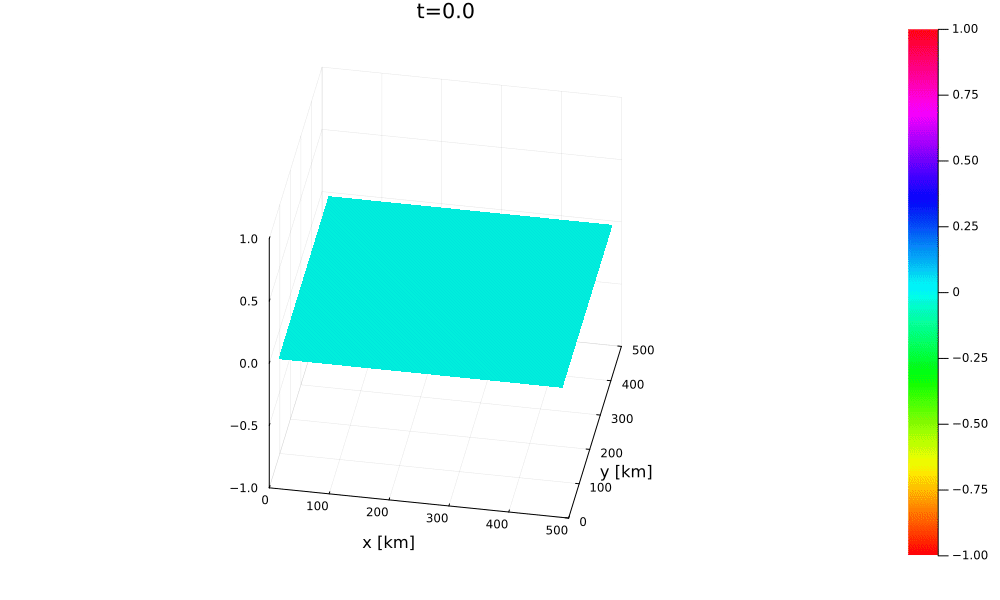

In [19]:
"""
function plot_wave1d(f,sol,t)
Create a plot from the 1d wave equation solution at time t
"""
function plot_wave2d(f,sol,t)
    nx=20
    ny=20
    Δx=f.Δx
    Δy=f.Δy
    (x_h,y_h)=h_grid(nx,ny,Δx,Δy)
    #cgrad(:blues,rev=true)
  
    surface(1.0e-3*x_h,1.0e-3*y_h,Array(sol(t).h)',c=cgrad(:hsv),
    zlims=[-1.0,1.0],label="t=$(t)",xlims=(0.0,1.0e-3*f.Lx),ylims=(0.0,1.0e-3*f.Ly),clims=(-1.0,1.0),camera = (10, 35),
                     cbar=true,axis=true,grid=true,size=(1000,600)) #clims=(-0.5,0.5),
    xlabel!("x [km]")
    ylabel!("y [km]")
    title!("t=$(t/3600.0)")
end
   
function animate_wave2d(f,sol, timestep=10.0, fps=30)
	# create an animation
    times = sol.t[1]:timestep:sol.t[end] # times at which to plot
    ntimes = length(times)
    anim = @animate for i in 1:ntimes
      plot_wave2d(f,sol,times[i])
    end
	return gif(anim, fps = fps)
end

animate_wave2d(fs,sol,30*60.0, 10)

In [23]:
"""
function plot_error2d(f,sol_h,sol,t)
Create a plot from the 1d wave error
"""
function plot_err2d(f,sol_h,sol ,t)
    nx=f.nx
    ny=f.ny
    Δx=f.Δx
    Δy=f.Δy
    (x_h,y_h)=h_grid(nx,ny,Δx,Δy)
    #cgrad(:blues,rev=true)
    higher_sol = (2^4 .* Array(sol_h(t).h) - Array(sol(t).h)) ./ (2^4-1) #richardson interpol
    surface(1.0e-3*x_h,1.0e-3*y_h,Array(abs.(higher_sol-Array(sol(t).h)))' .* 100000,c=cgrad(:hsv),
    zlims=[-0.0,1.0],label="t=$(t)",xlims=(0.0,1.0e-3*f.Lx),ylims=(0.0,1.0e-3*f.Ly),clims=(-1.0,1.0),camera = (10, 35),
                     cbar=true,axis=true,grid=true,size=(1000,600)) #clims=(-0.5,0.5),
    xlabel!("x [km]")
    ylabel!("y [km]")
    title!("t=$(t/3600.0)")
end
   
function animate_wave2d(f,sol_h,sol, timestep=10.0, fps=30)
	# create an animation
    times = sol.t[1]:timestep:sol.t[end] # times at which to plot
    ntimes = length(times)
    anim = @animate for i in 1:ntimes
      plot_err2d(f,sol_h,sol,times[i])
    end
	return gif(anim, fps = fps)
end

#animate_wave2d(f,sol_h, sol,30*60.0, 10)

animate_wave2d (generic function with 4 methods)

In [58]:
#save errors between lower and higher order solution
t = 0
tlist = Float32[]
errl1 = Float32[]
errl2 = Float32[]
errl3 = Float32[]

for i in 0:size(sol.t)[1]
    t=250 *i
    higher_sol = (8^4 .* Array(sol_h3(t).h) - Array(sol(t).h)) ./ (8^4-1) #richardson interpol
    err1 = Array(abs.(higher_sol-Array(sol_h1(t).h)))' 
    err2 = Array(abs.(higher_sol-Array(sol_h2(t).h)))' 
    err3 = Array(abs.(higher_sol-Array(sol_h3(t).h)))'
    maxerr1 = norm(err1)[1]
    maxerr2 = norm(err2)[1]
    maxerr3 = norm(err3)[1]
    push!(errl1, maxerr1)
    push!(errl2, maxerr2)
    push!(errl3, maxerr3)
    push!(tlist, t/(24*3600))
end


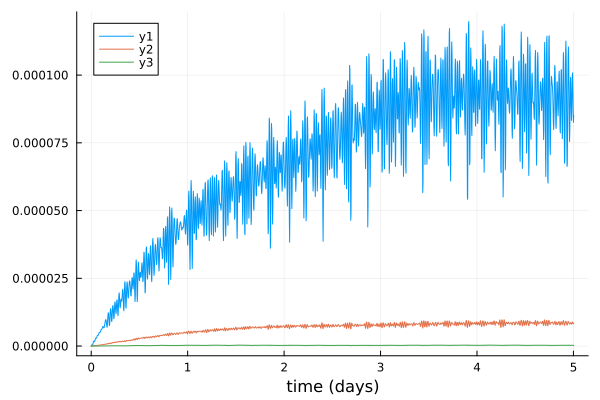

In [60]:
plot(tlist[1:end],errl1[1:end])
plot!(tlist[1:end],errl2[1:end])
plot!(tlist[1:end],errl3[1:end])
xlabel!("time (days)")

In [59]:
#log2(norm(errl1[:end])/ norm(errl2[end-20:end]))
log2(norm(errl2[end-1:end])/ norm(errl3[end-1:end]))
log2(norm(errl1[end-1:end])/ norm(errl3[end-1:end]))/2
log2(norm(errl2[end-1:end])/ norm(errl3[end-1:end]))


5.0519447f0

In [28]:
# setup the ODE proble
wave_ode=ODEProblem(f,x0,time_span)
# solve the ODE problem
# select no output for benchmarking
#@time sol_no_ouput=solve(wave_ode, Tsit5(),save_everystep=false,save_start=false,save_end=false);
CUDA.@time sol=solve(wave_ode, RK4(), dt=Float32(500.0),saveat =Float32(2*24*3600): Float32(12*3600):Float32(10*24*3600),  adaptive=false); # now save the solution
 # do not save the solution when benchmarking
nothing

 17.178476 seconds (7.50 M CPU allocations: 310.057 MiB, 0.74% gc time) (69.17 k GPU allocations: 1.306 MiB, 74.64% memmgmt time)


In [29]:
sol.t

17-element Vector{Float64}:
 172800.0
 216000.0
 259200.0
 302400.0
 345600.0
 388800.0
 432000.0
 475200.0
 518400.0
 561600.0
 604800.0
 648000.0
 691200.0
 734400.0
 777600.0
 820800.0
 864000.0

# Some remarks
-> If a remove bottom friction, the numerical errors are  not increasing
-> Without bottom friction numerical errors are increasing. 
-> Removing Coriolis leads to a faster increase in errors over time. 
